In [ ]:
!pip install fastai --upgrade

In [ ]:
from fastai.vision.all import *

Povezivanje colaba i mog drive-a gde su mi podaci smjesteni, nista pametno

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)
root_dir = 'gdrive/MyDrive/Colab Notebooks/'
base_dir = root_dir + 'castles'
path = Path(base_dir)

Mounted at /content/gdrive


**DataBlock API** sam koristio bukvalno kao black box, nasao sam na internetu kako se koristi i bukvalno sam to primenio.
Nisam zalazio duboko u dokumentaciju, samo sam nasao da je to alat koji mi mapira naziv foldera na slike kao labelu i da ga mogu koristiti da skaliram slike, mada cu probati da vidim kako se model ponasa ako je treniran podacima koji nisu skalirani.

In [ ]:
fields = DataBlock(blocks = (ImageBlock, CategoryBlock),
                   get_items = get_image_files,
                   get_y = parent_label,
                   splitter = RandomSplitter(valid_pct=0.2, seed=42),
                   item_tfms=RandomResizedCrop(224, min_scale=0.5),
                   batch_tfms=aug_transforms())

In [ ]:
dls = fields.dataloaders(path)

In [ ]:
dls.vocab

['africa', 'america', 'asia', 'europe']

Par primera slika iz data seta

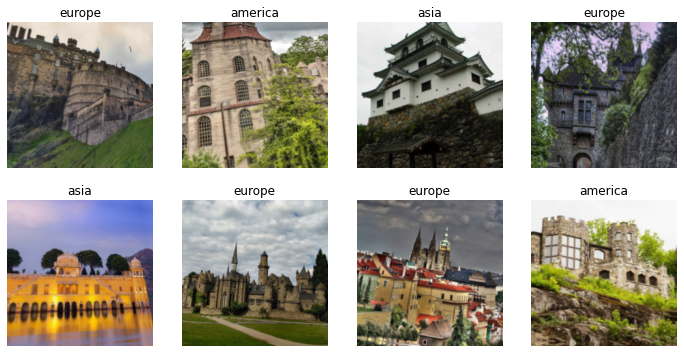

In [ ]:
dls.train.show_batch(max_n=8, nrows=2)

Trenirao sam 8 epoha iz nepoznatog razloga, ne znam da li postoji neki optimalan broj epoha koliko se trenira neuronska mreza da se dobije optimalno ponasanje.

In [ ]:
learn = cnn_learner(dls, resnet34, metrics=error_rate)
learn.fine_tune(8)

epoch,train_loss,valid_loss,error_rate,time
0,2.094356,1.579009,0.549020,00:13


epoch,train_loss,valid_loss,error_rate,time
0,1.150930,0.835928,0.294118,00:13
1,0.995826,0.652148,0.215686,00:13
2,0.833184,0.648070,0.205882,00:14
3,0.688249,0.647096,0.196078,00:13
4,0.584164,0.610770,0.176471,00:14
5,0.503454,0.600825,0.186275,00:13
6,0.430920,0.603968,0.176471,00:13
7,0.381982,0.607190,0.176471,00:13


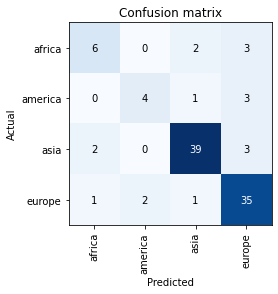

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

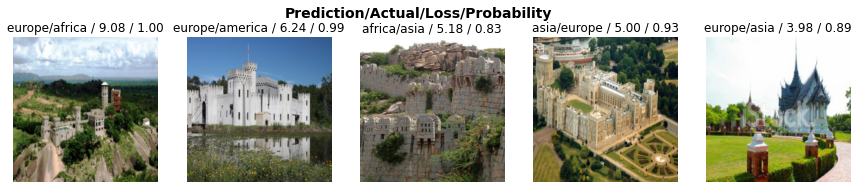

In [ ]:
interp.plot_top_losses(5, nrows=1)

Ovaj deo predstavlja samo kod za ucitavanje slika, nista pametno

In [ ]:
from google.colab import files
from IPython.display import Image

In [ ]:
uploaded = files.upload()

Saving asia3.jpg to asia3.jpg


In [ ]:
img_europe = PILImage.create("castle.jpg")
img_asia = PILImage.create("asia.jpg")
img_asia1 = PILImage.create("asia1.jpeg")
img_asia3 = PILImage.create("asia3.jpg")

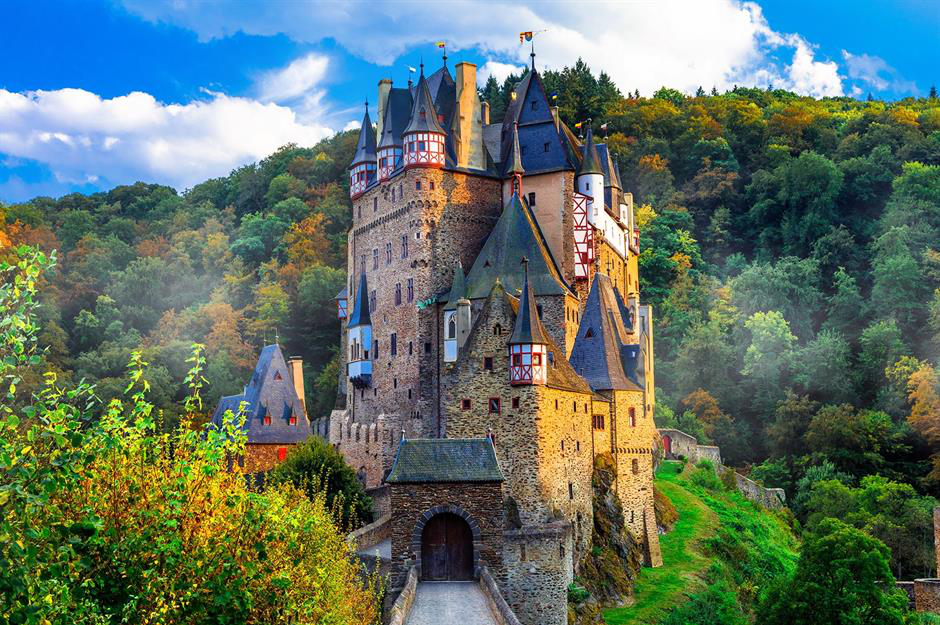

In [ ]:
img

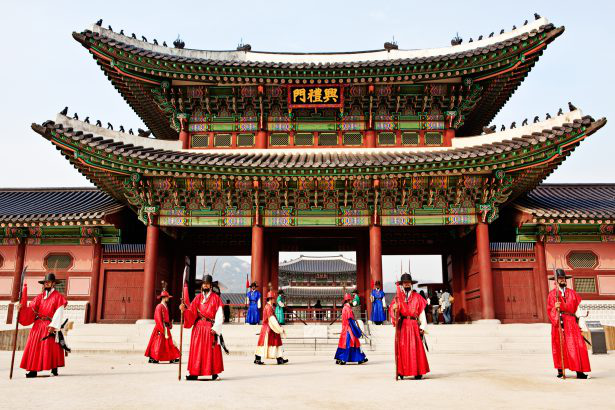

In [ ]:
img_asia

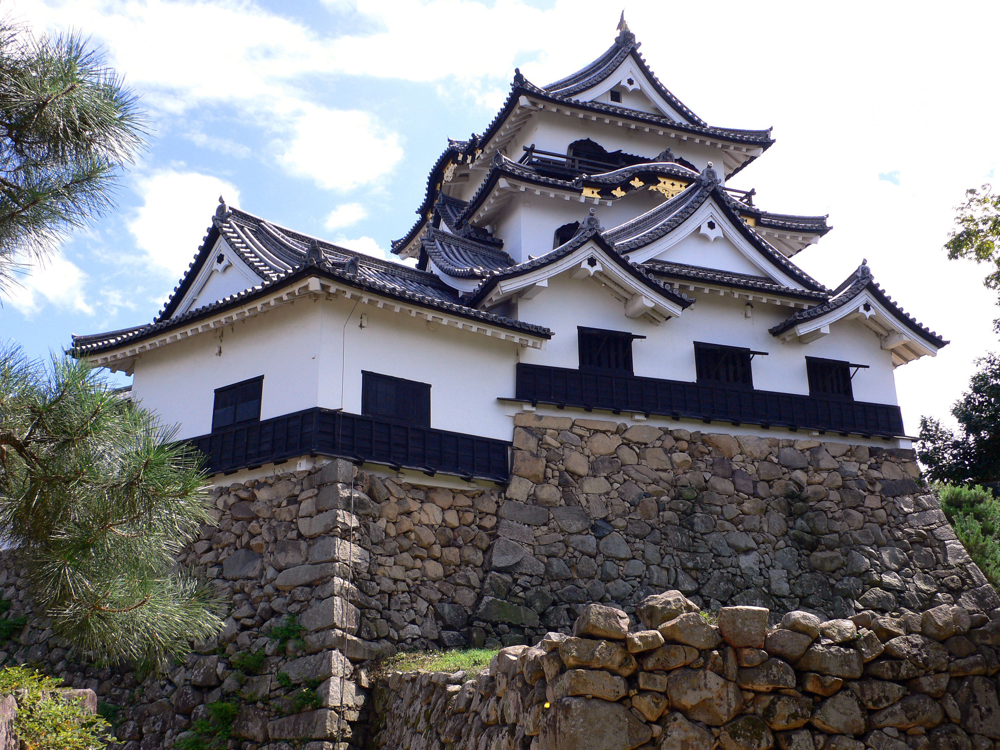

In [ ]:
img_asia3

In [ ]:
def is_castle(predicted_castle, expected_castle): 
  if predicted_castle == expected_castle:
    return True
  else:
    return False

# Predicting is a castle from **Europe**

In [ ]:
castleeurope,_,probs = learn.predict(img_europe)

In [ ]:
print(f"Is this a europe castle: {is_castle(castleeurope, 'europe')}.")
print(f"Probability that it is a europe castle {probs[1].item():.6f}.")

Is this a europe castle: True.
Probability that it is a europe castle 0.034589.


# Predicting is a castle from **Asia**

In [ ]:
castle_asia,_,probs_asia = learn.predict(img_asia3) 

In [ ]:
print(f"Is this a asia castle: {is_castle(castle_asia, 'asia')}.")
print(f"Probability that it is a asia castle {probs_asia[1].item():.6f}.")

Is this a asia castle: True.
Probability that it is a asia castle 0.000056.
